## Ireland maps

In [1]:
import pandas as pd
import geopandas as gpd
import json
import matplotlib as mpl
import pylab as plt

from bokeh.io import output_file, show, output_notebook, export_png
from bokeh.models import ColumnDataSource, GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.tile_providers import get_provider, Vendors
from bokeh.plotting import figure
from bokeh.palettes import brewer

import panel as pn
import panel.widgets as pnw
pn.extension()
output_notebook()

Loading BokehJS ...

In [5]:
def get_geodatasource(gdf):    
    """Get getjsondatasource from geopandas object"""
    json_data = json.dumps(json.loads(gdf.to_json()))
    return GeoJSONDataSource(geojson = json_data)

In [2]:
idf = gpd.read_file('data/counties.shp')
#idf = gpd.read_file('data/Census2011_Admin_Counties_generalised20m.shp')
testdata = pd.read_csv('data/ireland_test_data.csv')
mg = idf.merge(testdata,left_on='NAME_TAG',right_on='county',how='left')
#idf.head()

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:479: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


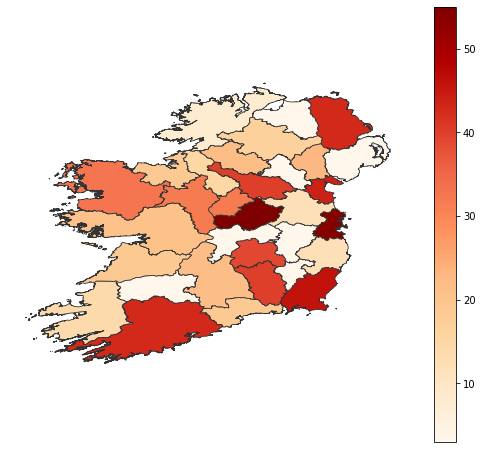

In [6]:
fig, ax = plt.subplots(1, figsize=(9,8))
mg.plot(column='value', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.2',legend=True)
ax.axis('off')
plt.savefig('test_ireland.png',dpi=150)

In [8]:
def bokeh_plot_map(geosource, column=None, title=''):
    """Plot bokeh map from GeoJSONDataSource """
    
    palette = brewer['OrRd'][8]
    palette = palette[::-1]
    #Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    #max = merged.Deaths.max()
    color_mapper = LinearColorMapper(palette = palette)#, low = 0, high = 100)

    #tick_labels = {'0': '0%', '5': '5%', '10':'10%', '15':'15%', '20':'20%', '25':'25%', '30':'30%','35':'35%', '40': '>40%'}
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                border_line_color=None,location = (0,0), orientation = 'horizontal')

    tools = 'wheel_zoom,pan,reset'
    p = figure(title = title, plot_height = 400 , plot_width = 850, toolbar_location = 'right', tools=tools)
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    #Add patch renderer to figure
    p.patches('xs','ys', source=geosource, fill_alpha=1, line_width=0.5, line_color='black',  
              fill_color={'field' :column , 'transform': color_mapper})
    #Specify figure layout.
    p.add_layout(color_bar, 'below')
    return p

In [10]:
geosource = get_geodatasource(mg)
p = bokeh_plot_map(geosource, column='value')


In [12]:
pn.pane.Bokeh(p)

Bokeh(Figure)